In [ ]:
from IPython.core.magic import register_line_cell_magic
from sklearn.model_selection import train_test_split
from IPython.display import Image, clear_output
from google.colab import drive
from glob import glob
import random
import shutil
import torch
import yaml
import cv2
import os

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# filepaths = list(glob('/content/drive/MyDrive/IITP_졸음운전/data/images/*.jpg'))

# len(filepaths)

# YOLOv9 Git Clone

In [ ]:
%cd /content/

/content


In [ ]:
!git clone https://github.com/SkalskiP/yolov9.git

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (218/218), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 325 (delta 159), reused 156 (delta 156), pack-reused 107
Receiving objects: 100% (325/325), 2.23 MiB | 28.61 MiB/s, done.
Resolving deltas: 100% (165/165), done.


In [ ]:
!ls

drive  sample_data  yolov9


In [ ]:
%cd /content/yolov9/
!pip install -qr requirements.txt

/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 55.0 MB/s eta 0:00:00


In [ ]:
!pwd

/content/yolov9


# 데이터셋 구성
- roboflow smoke dataset

In [ ]:
# %mkdir /content/yolov5/car
# %cd /content/yolov5/car
# !pwd

In [ ]:
# %cd /content/drive/MyDrive/IITP_졸음운전
# !unzip -q "/content/drive/MyDrive/IITP_졸음운전/이선오/images.zip" -d "/content/yolov5/car_test"

In [ ]:
# !unzip -q "/content/drive/MyDrive/IITP_졸음운전/이선오/labels.zip" -d "/content/yolov5/car_test"

In [ ]:
%cd /content/drive/MyDrive/IITP_졸음운전

!unzip -q "/content/drive/MyDrive/IITP_졸음운전/data.zip" -d "/content/yolov9/car_test"

/content/drive/.shortcut-targets-by-id/1m8RYxpHLPj320yDPfTg1abSb0kFSqO1G/IITP_졸음운전


In [ ]:
%cd /content/yolov9/car_test

/content/yolov9/car_test


In [ ]:
%ls

dataset/


In [ ]:
os.mkdir('train')
os.mkdir('train/images')
os.mkdir('train/labels')

os.mkdir('test')
os.mkdir('test/images')
os.mkdir('test/labels')

os.mkdir('valid')
os.mkdir('valid/images')
os.mkdir('valid/labels')

In [ ]:
img_list = glob('/content/yolov9/car_test/dataset/images/*.jpg')
lab_list = glob('/content/yolov9/car_test/dataset/labels/*.txt')

print(len(img_list), len(lab_list))

29917 29917


In [ ]:
train_img_list, test_img_list = train_test_split(img_list, test_size=0.3)

print(len(train_img_list), len(test_img_list))

20941 8976


In [ ]:
test_img_list, valid_img_list = train_test_split(test_img_list, test_size=0.3)

print(len(test_img_list), len(valid_img_list))

6283 2693


In [ ]:
print(train_img_list[0], '\n', test_img_list[0], '\n', valid_img_list[0])

/content/yolov9/car_test/dataset/images/SGA2100029S0183IMG0005.jpg 
 /content/yolov9/car_test/dataset/images/SGA2100026S0199IMG0001.jpg 
 /content/yolov9/car_test/dataset/images/SGA2100032S0182IMG0001.jpg


In [ ]:
train_img = '/content/yolov9/car_test/train/images'
test_img = '/content/yolov9/car_test/test/images'
valid_img = '/content/yolov9/car_test/valid/images'

train_lab = '/content/yolov9/car_test/train/labels'
test_lab = '/content/yolov9/car_test/test/labels'
valid_lab = '/content/yolov9/car_test/valid/labels'

In [ ]:
img_dir = '/content/yolov9/car_test/dataset/images'
lab_dir = '/content/yolov9/car_test/dataset/labels'

for fname in train_img_list :
    fname = fname.split('/')[-1]
    shutil.move(img_dir + '/' + fname, train_img + '/' + fname)
    fname = os.path.splitext(fname)[0]
    shutil.move(lab_dir + '/' + fname + '.txt', train_lab + '/' + fname + '.txt')

for fname in test_img_list :
    fname = fname.split('/')[-1]
    shutil.move(img_dir + '/' + fname, test_img + '/' + fname)
    fname = os.path.splitext(fname)[0]
    shutil.move(lab_dir + '/' + fname + '.txt', test_lab + '/' + fname + '.txt')

for fname in valid_img_list :
    fname = fname.split('/')[-1]
    shutil.move(img_dir + '/' + fname, valid_img + '/' + fname)
    fname = os.path.splitext(fname)[0]
    shutil.move(lab_dir + '/' + fname + '.txt', valid_lab + '/' + fname + '.txt')

In [ ]:
train_img_list = glob('/content/yolov9/car_test/train/images/*.jpg')
test_img_list = glob('/content/yolov9/car_test/test/images/*.jpg')
valid_img_list = glob('/content/yolov9/car_test/valid/images/*.jpg')
train_lab_list = glob('/content/yolov9/car_test/train/labels/*.txt')
test_lab_list = glob('/content/yolov9/car_test/test/labels/*.txt')
valid_lab_list = glob('/content/yolov9/car_test/valid/labels/*.txt')

print('num of images:', len(train_img_list), len(test_img_list), len(valid_img_list))
print('num of labels:', len(train_lab_list), len(test_lab_list), len(valid_lab_list))

num of images: 20941 6283 2693
num of labels: 20941 6283 2693


In [ ]:
# train, test, valid 이미지 데이터 정보 txt 파일로 생성
with open('/content/yolov9/car_test/train.txt', 'w') as f :
    f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov9/car_test/test.txt', 'w') as f :
    f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov9/car_test/valid.txt', 'w') as f :
    f.write('\n'.join(valid_img_list)+'\n')

In [ ]:
# IPython에서 입력된 내용을 텍스트처럼 계속 사용하기 위한 register_line_cell_magic 정의
from IPython.core.magic import register_line_cell_magic

# register_line_cell_magic을 이용해 IPython에서 바로 사용할 수 있게 정의
# writetimplate를 쉽게 사용할 수 있음
@register_line_cell_magic
def writetemplate(line, cell) :
    with open(line, 'w') as f :
        f.write(cell.format(**globals()))

In [ ]:
# data.yaml 확인 및 수정
%cat /content/yolov9/data/coco.yaml

path: ../datasets/coco  # dataset root dir
train: train2017.txt  # train images (relative to 'path') 118287 images
val: val2017.txt  # val images (relative to 'path') 5000 images
test: test-dev2017.txt  # 20288 of 40670 images, submit to https://competitions.codalab.org/competitions/20794

# Classes
names:
  0: person
  1: bicycle
  2: car
  3: motorcycle
  4: airplane
  5: bus
  6: train
  7: truck
  8: boat
  9: traffic light
  10: fire hydrant
  11: stop sign
  12: parking meter
  13: bench
  14: bird
  15: cat
  16: dog
  17: horse
  18: sheep
  19: cow
  20: elephant
  21: bear
  22: zebra
  23: giraffe
  24: backpack
  25: umbrella
  26: handbag
  27: tie
  28: suitcase
  29: frisbee
  30: skis
  31: snowboard
  32: sports ball
  33: kite
  34: baseball bat
  35: baseball glove
  36: skateboard
  37: surfboard
  38: tennis racket
  39: bottle
  40: wine glass
  41: cup
  42: fork
  43: knife
  44: spoon
  45: bowl
  46: banana
  47: apple
  48: sandwich
  49: orange
  50: broccol

In [ ]:
# 아래 내용으로 새로운 data.yaml 저장
# 모델이 학습하는 위치는 /content/yolov9 이므로 train: ./car_test/train/images 경로 지정
%%writetemplate /content/yolov9/car_test/data.yaml

train: ./car_test/train/images
test: ./car_test/test/images
val: ./car_test/valid/images

nc: 4
names: ['drowsy', 'search', 'phone', 'normal']

In [ ]:
# 수정된 data.yaml 확인
%cat /content/yolov9/car_test/data.yaml


train: ./car_test/train/images
test: ./car_test/test/images
val: ./car_test/valid/images

nc: 4
names: ['drowsy', 'search', 'phone', 'normal']


# 모델 구성하기

In [ ]:
!cat /content/yolov9/models/detect/gelan-c.yaml

# YOLOv9

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
#activation: nn.LeakyReLU(0.1)
#activation: nn.ReLU()

# anchors
anchors: 3

# gelan backbone
backbone:
  [
   # conv down
   [-1, 1, Conv, [64, 3, 2]],  # 0-P1/2

   # conv down
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4

   # elan-1 block
   [-1, 1, RepNCSPELAN4, [256, 128, 64, 1]],  # 2

   # avg-conv down
   [-1, 1, ADown, [256]],  # 3-P3/8

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 256, 128, 1]],  # 4

   # avg-conv down
   [-1, 1, ADown, [512]],  # 5-P4/16

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 6

   # avg-conv down
   [-1, 1, ADown, [512]],  # 7-P5/32

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 8
  ]

# gelan head
head:
  [
   # elan-spp block
   [-1, 1, SPPELAN, [512, 256]],  # 9

   # up-concat merge
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # ca

In [ ]:
# 함수 사용 대신 숫자 1 입력해도 무방함
with open('/content/yolov9/car_test/data.yaml', 'r') as stream:
    n_classes = str(yaml.safe_load(stream)['nc'])               # nc indexing

print(n_classes)

4


In [ ]:
%%writetemplate /content/yolov9/models/car_gelan_c.yaml
# YOLOv9

# parameters
nc: {n_classes}  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
#activation: nn.LeakyReLU(0.1)
#activation: nn.ReLU()

# anchors
anchors: 3

# gelan backbone
backbone:
  [
   # conv down
   [-1, 1, Conv, [64, 3, 2]],  # 0-P1/2

   # conv down
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4

   # elan-1 block
   [-1, 1, RepNCSPELAN4, [256, 128, 64, 1]],  # 2

   # avg-conv down
   [-1, 1, ADown, [256]],  # 3-P3/8

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 256, 128, 1]],  # 4

   # avg-conv down
   [-1, 1, ADown, [512]],  # 5-P4/16

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 6

   # avg-conv down
   [-1, 1, ADown, [512]],  # 7-P5/32

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 8
  ]

# gelan head
head:
  [
   # elan-spp block
   [-1, 1, SPPELAN, [512, 256]],  # 9

   # up-concat merge
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 12

   # up-concat merge
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [256, 256, 128, 1]],  # 15 (P3/8-small)

   # avg-conv-down merge
   [-1, 1, ADown, [256]],
   [[-1, 12], 1, Concat, [1]],  # cat head P4

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 18 (P4/16-medium)

   # avg-conv-down merge
   [-1, 1, ADown, [512]],
   [[-1, 9], 1, Concat, [1]],  # cat head P5

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 21 (P5/32-large)

   # detect
   [[15, 18, 21], 1, DDetect, [nc]],  # DDetect(P3, P4, P5)
  ]

In [ ]:
!cat /content/yolov9/models/car_gelan_c.yaml

# YOLOv9

# parameters
nc: 4  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
#activation: nn.LeakyReLU(0.1)
#activation: nn.ReLU()

# anchors
anchors: 3

# gelan backbone
backbone:
  [
   # conv down
   [-1, 1, Conv, [64, 3, 2]],  # 0-P1/2

   # conv down
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4

   # elan-1 block
   [-1, 1, RepNCSPELAN4, [256, 128, 64, 1]],  # 2

   # avg-conv down
   [-1, 1, ADown, [256]],  # 3-P3/8

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 256, 128, 1]],  # 4

   # avg-conv down
   [-1, 1, ADown, [512]],  # 5-P4/16

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 6

   # avg-conv down
   [-1, 1, ADown, [512]],  # 7-P5/32

   # elan-2 block
   [-1, 1, RepNCSPELAN4, [512, 512, 256, 1]],  # 8
  ]

# gelan head
head:
  [
   # elan-spp block
   [-1, 1, SPPELAN, [512, 256]],  # 9

   # up-concat merge
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat

# Training

In [ ]:
!pwd

/content/yolov9


In [ ]:
%cd /content/yolov9
!ls

/content/yolov9
benchmarks.py  detect.py   models	requirements.txt  train_dual.py    val_dual.py
car_test       export.py   panoptic	runs		  train.py	   val.py
classify       figure	   __pycache__	scripts		  train_triple.py  val_triple.py
data	       hubconf.py  README.md	segment		  utils


- train.py 파일 실행시켜서 학습
- 지정할 옵션 정보 전달

In [ ]:
# --weights yolov9.pt : --weights '' 가능. yolov9의 가중치 사용하지 않고 처음부터 학습
!python train.py --img 128 --batch 32 --epochs 50 --data ./car_test/data.yaml --cfg ./models/car_gelan_c.yaml --weights '' --name car_test/results --cache --hyp hyp.scratch-high.yaml

2024-06-18 07:08:18.180763: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-18 07:08:18.180816: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-18 07:08:18.182461: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-18 07:08:18.192268: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-18 07:08:19.873036: W tensorflow/compiler/tf2

In [ ]:
# 진행 상황 확인
%load_ext tensorboard
%tensorboard --logdir /content/yolov9/runs/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
%ls /content/yolov9/runs/train/car_test/results

events.out.tfevents.1718693146.095ccaf2fe65.3283.0  labels_correlogram.jpg  opt.yaml
hyp.yaml                                            labels.jpg              weights/


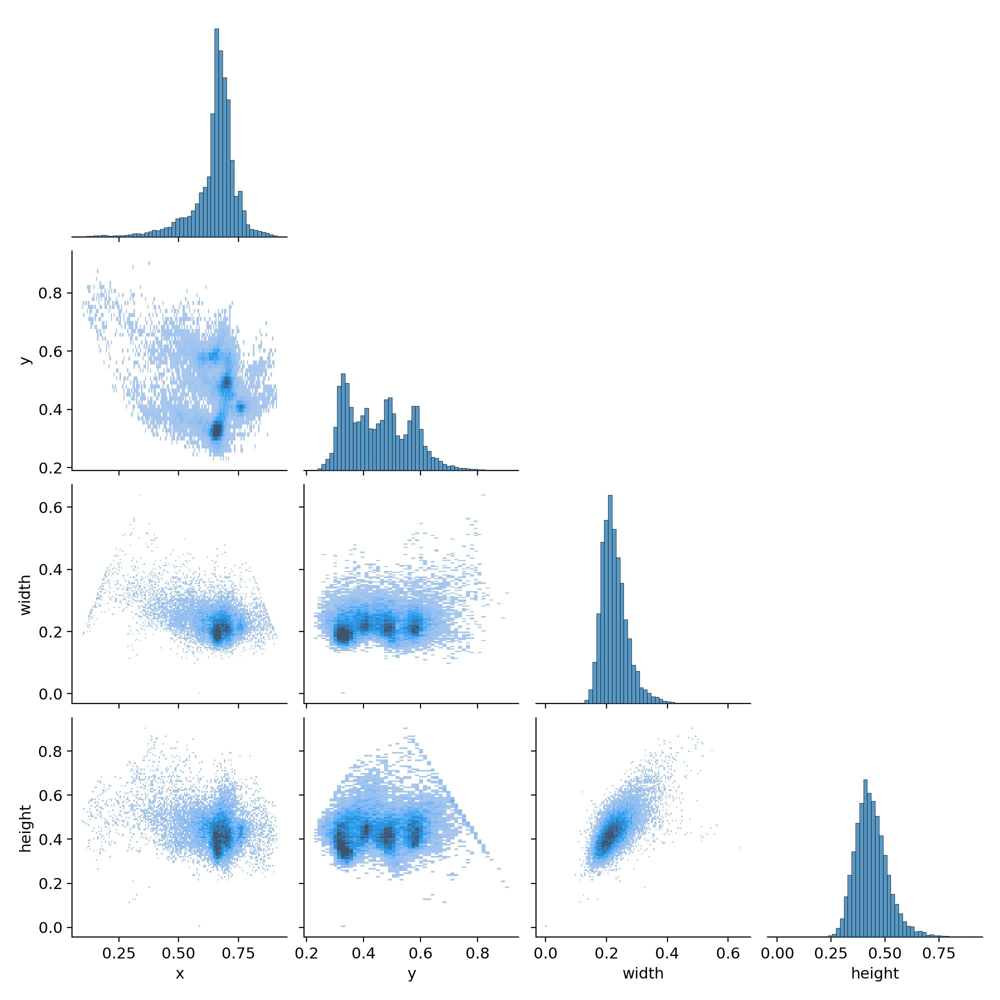

In [ ]:
Image(filename='./runs/train/car_test/results/labels_correlogram.jpg', width=1000)

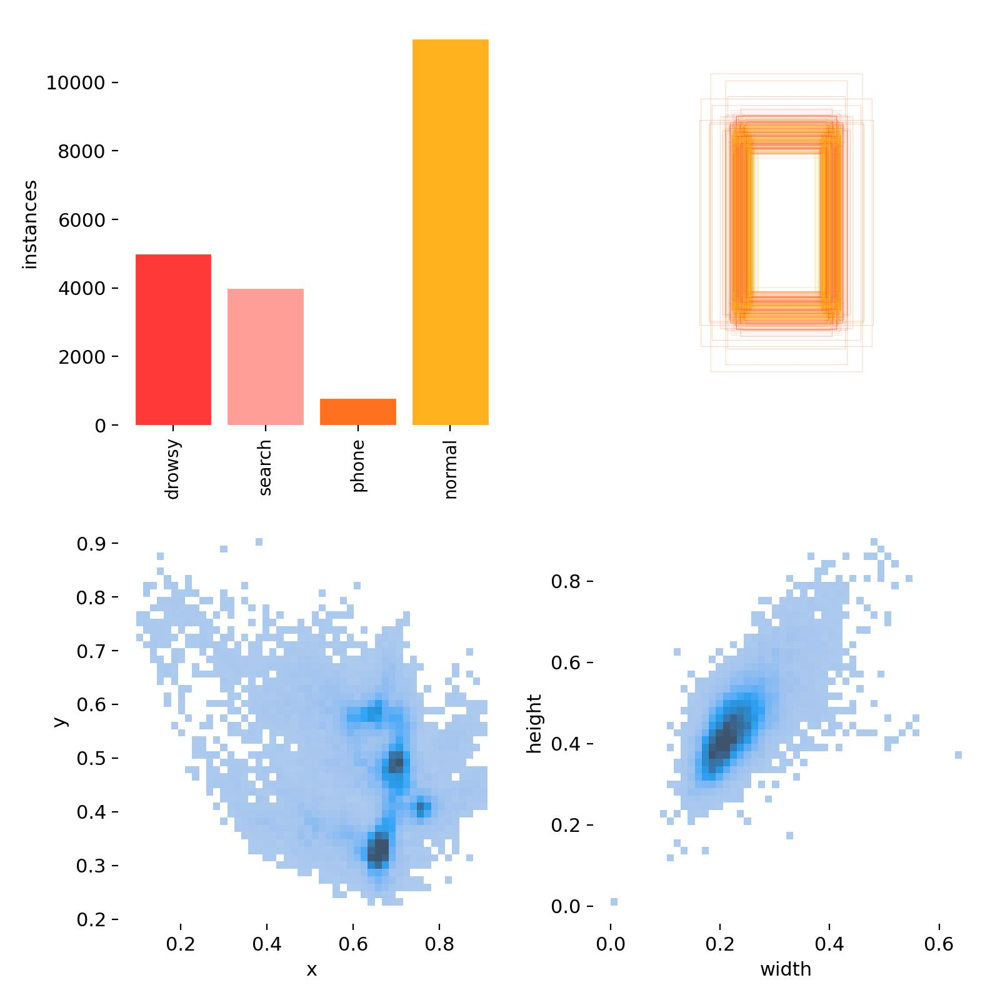

In [ ]:
Image(filename='./runs/train/car_test/results/labels.jpg', width=800)

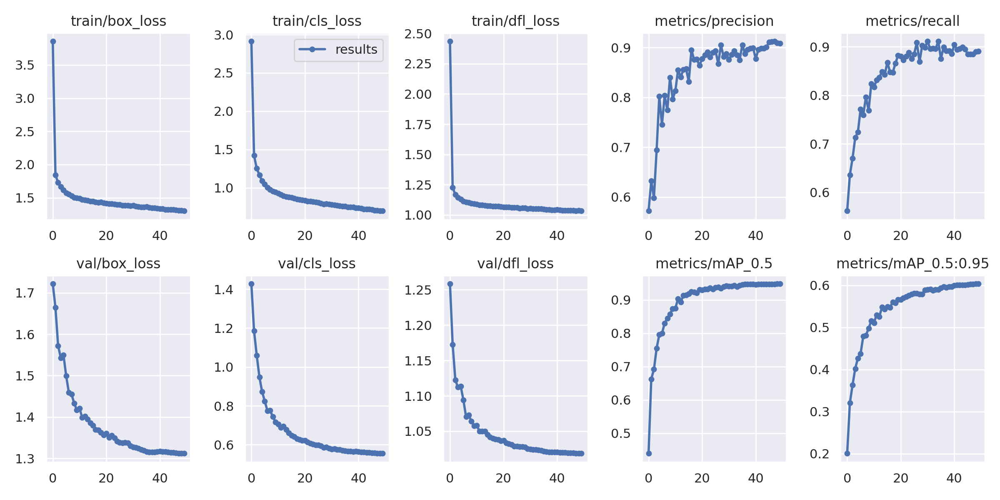

In [ ]:
Image(filename="./runs/train/car_test/results2/results.png", width=1000)

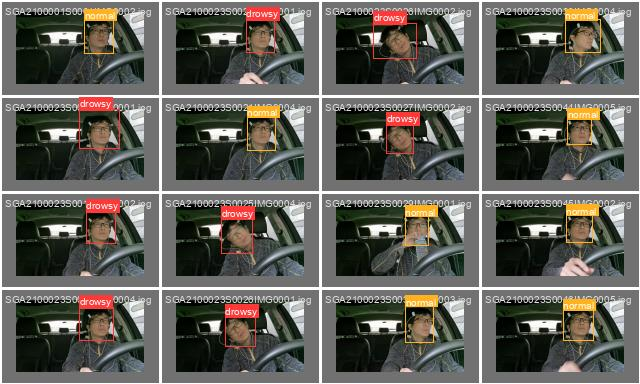

In [ ]:
Image(filename='./runs/train/car_test/results2/val_batch0_labels.jpg', width=800)

# Validation

In [ ]:
%ls /content/yolov9/runs/train/car_test/results2/weights

best.pt  best_striped.pt  last.pt  last_striped.pt


In [ ]:
!python val.py --weights runs/train/car_test/results2/weights/best.pt --data ./car_test/data.yaml --img 640 --iou 0.65 --half

val: data=./car_test/data.yaml, weights=['runs/train/car_test/results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False, min_items=0
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
car_gelan_c summary: 467 layers, 25414044 parameters, 0 gradients, 102.5 GFLOPs
val: Scanning /content/yolov9/car_test/valid/labels.cache... 2693 images, 7 backgrounds, 0 corrupt: 100% 2693/2693 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 85/85 [00:57<00:00,  1.47it/s]
                   all       2693       2688     0.0246     0.0424    0.00774    0.00108
                drowsy       2693        684          0          0    0.00103   0.000176

In [ ]:
!python val.py --weights runs/train/car_test/results2/weights/best.pt --data ./car_test/data.yaml --img 640 --task test

val: data=./car_test/data.yaml, weights=['runs/train/car_test/results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
car_gelan_c summary: 467 layers, 25414044 parameters, 0 gradients, 102.5 GFLOPs
test: Scanning /content/yolov9/car_test/test/labels... 6283 images, 10 backgrounds, 0 corrupt: 100% 6283/6283 [00:19<00:00, 320.00it/s]
test: New cache created: /content/yolov9/car_test/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 197/197 [02:46<00:00,  1.18it/s]
                   all       6283       6278      0.025     0.0495    0.00766    0.00109
             

In [ ]:
!ls /content/yolov9/runs/train/car_test/results2/weights

best.pt  best_striped.pt  last.pt  last_striped.pt


In [ ]:
!python detect.py --weights runs/train/car_test/results2/weights/best.pt --img 640 --conf 0.4 --source ./car_test/test/images/

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
image 1286/6283 /content/yolov9/car_test/test/images/SGA2100005S0394IMG0005.jpg: 384x640 1 search, 22.3ms
image 1287/6283 /content/yolov9/car_test/test/images/SGA2100005S0397IMG0003.jpg: 384x640 1 search, 22.3ms
image 1288/6283 /content/yolov9/car_test/test/images/SGA2100005S0398IMG0001.jpg: 384x640 1 search, 21.9ms
image 1289/6283 /content/yolov9/car_test/test/images/SGA2100005S0398IMG0003.jpg: 384x640 1 search, 21.9ms
image 1290/6283 /content/yolov9/car_test/test/images/SGA2100005S0399IMG0001.jpg: 384x640 2 searchs, 21.9ms
image 1291/6283 /content/yolov9/car_test/test/images/SGA2100005S0399IMG0005.jpg: 384x640 (no detections), 21.9ms
image 1292/6283 /content/yolov9/car_test/test/images/SGA2100005S0401IMG0002.jpg: 384x640 2 searchs, 21.9ms
image 1293/6283 /content/yolov9/car_test/test/images/SGA2100005S0402IMG0004.jpg: 384x640 1 search, 21.5ms
image 1294/6283 /content/yolov9/car_test/test/images/SGA2100005S0403IMG0005.jpg: 384x640 2 searchs, 21.4ms


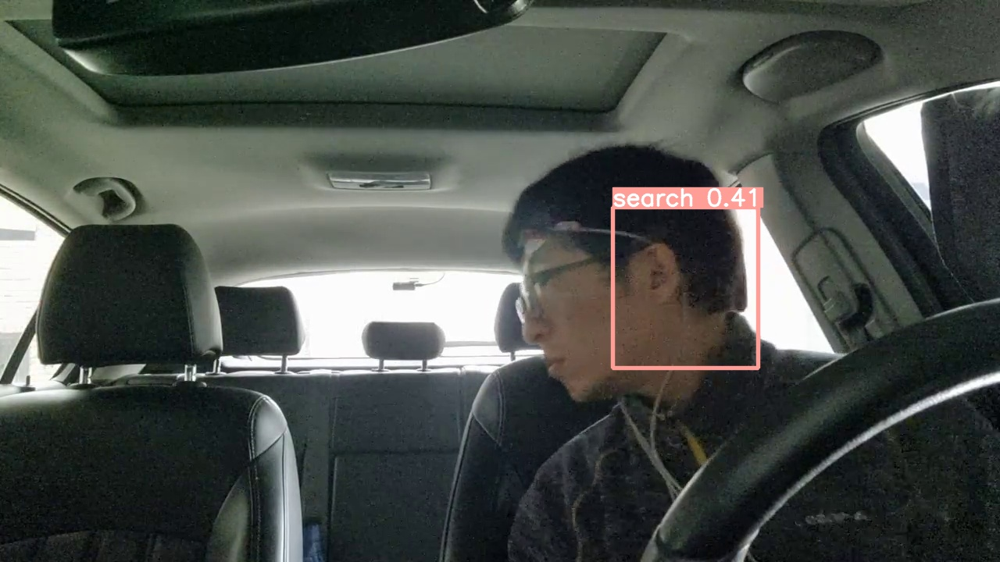

In [ ]:
image_name = random.choice(glob('/content/yolov9/runs/detect/exp/*.jpg'))
Image(filename=image_name)

# 모델 저장

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/IITP_졸음운전/test_files
!pwd

/content/drive/.shortcut-targets-by-id/1m8RYxpHLPj320yDPfTg1abSb0kFSqO1G/IITP_졸음운전/test_files
/content/drive/.shortcut-targets-by-id/1m8RYxpHLPj320yDPfTg1abSb0kFSqO1G/IITP_졸음운전/test_files


In [ ]:
# !mkdir yolov5_sample

In [ ]:
%cp /content/yolov9/runs/train/car_test/results2/weights/best.pt /content/drive/MyDrive/IITP_졸음운전/test_files/yolov9_car_best_all.pt

In [ ]:
%cd /content/yolov9

/content/yolov9


- 영상 detection 시 프레임 단위로 잘림
- 영상 소리가 없어지는 단점이 있음

In [ ]:
!python detect.py --weights /content/yolov9/runs/train/car_test/results2/weights/best.pt --source /content/drive/MyDrive/IITP_졸음운전/test_files/test.mp4

detect: weights=['/content/yolov9/runs/train/car_test/results2/weights/best.pt'], source=/content/drive/MyDrive/IITP_졸음운전/test_files/test.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
car_gelan_c summary: 467 layers, 25414044 parameters, 0 gradients, 102.5 GFLOPs
video 1/1 (1/252) /content/drive/.shortcut-targets-by-id/1m8RYxpHLPj320yDPfTg1abSb0kFSqO1G/IITP_졸음운전/test_files/test.mp4: 384x640 1 drowsy, 4 searchs, 1 normal, 114.2ms
video 1/1 (2/252) /content/drive/.shortcut-targets-by-id/1m8RYxpHLPj320yDPfTg1abSb0kFSqO1G/IITP_졸음운전/test_fi

In [ ]:
!cp /content/yolov9/runs/detect/exp3/test.mp4 /content/drive/MyDrive/IITP_졸음운전/test_files/test_all_detection_yolov9.mp4